In [1]:
%load_ext autoreload
%autoreload 2


import scanpy as sc
import seaborn as sns
import pandas as pd
from scipy.stats import median_abs_deviation
from sklearn.mixture import GaussianMixture
import numpy as np
import matplotlib.pyplot as plt
import scrublet as scr
from tqdm.notebook import tqdm
from diptest import diptest
from scipy.sparse import csr_matrix
import anndata as ad
import math
from dotenv import load_dotenv; load_dotenv()
import os
import ipynbname
import shutil

import decoupler as dc

from utils import preprocessing

# Hyperparamyters
BASE_PATH = os.getenv("BASE_PATH_FOR_SAVING")
SAMPLE_ID = "sample_09" # sample_01"
BCL = "240911_SL-EXD_0362_A22FLV2LT4"# 251027_SL-EXD_0706_A233KGFLT4 260313_SL-EXA_0758_B23GHNHLT4
LIBRARY = "SI-TT-E8"#"SI-TT-H3"

2026-04-30 15:34:39 | [INFO] cffi mode is CFFI_MODE.ANY
2026-04-30 15:34:39 | [INFO] R home found: /usr/lib/R
2026-04-30 15:34:39 | [INFO] R library path: /usr/lib/R/lib:/usr/lib/x86_64-linux-gnu:/usr/lib/jvm/default-java/lib/server:/usr/local/cuda-12.2/lib64:/usr/local/cuda-12.2/lib64:/usr/local/cuda-12.2/lib64
2026-04-30 15:34:39 | [INFO] LD_LIBRARY_PATH: /usr/lib/R/lib:/usr/lib/x86_64-linux-gnu:/usr/lib/jvm/default-java/lib/server:/usr/local/cuda-12.2/lib64:/usr/local/cuda-12.2/lib64:/usr/local/cuda-12.2/lib64
2026-04-30 15:34:39 | [INFO] Default options to initialize R: rpy2, --quiet, --no-save
2026-04-30 15:34:39 | [INFO] Environment variable "LD_LIBRARY_PATH" redefined by R and overriding existing variable. Current: "/usr/local/cuda-12.2/lib64:/usr/local/cuda-12.2/lib64:/usr/local/cuda-12.2/lib64", R: "/usr/lib/R/lib:/usr/lib/x86_64-linux-gnu:/usr/lib/jvm/default-java/lib/server:/usr/local/cuda-12.2/lib64:/usr/local/cuda-12.2/lib64:/usr/local/cuda-12.2/lib64"
2026-04-30 15:34:39 

# Goals

- QC metrics
- Plot cell type annotaions

# ATTENTION: Manual Intervention

In this notebook all is fixed, apart from where oyu need to manually enter some values:
- the lcusters that contains true Oligo, during Doublet removal

# Load Adata

In [2]:
ADATA_PATH = f'{BASE_PATH}/SlideTags_single_libraries/{SAMPLE_ID}/{BCL}/{LIBRARY}/adata/labelled_adata.h5ad'
print(ADATA_PATH)

adata = sc.read_h5ad(ADATA_PATH)

print(adata)

/home/gdallagl/myworkdir/data/XDP/SlideTags_single_libraries/sample_09/240911_SL-EXD_0362_A22FLV2LT4/SI-TT-E8/adata/labelled_adata.h5ad
AnnData object with n_obs × n_vars = 17334 × 38606
    obs: 'x', 'y', 'pct_intronic', 'frac_contamination', 'dbscan_clusters', 'dbscan_score', 'sample', 'has_spatial', 'Neighborhood_label', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Neighborhood_correlation_coefficient', 'Class_label', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Class_correlation_coefficient', 'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Subclass_correlation_coefficient', 'Group_label', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Group_correlation_coefficient', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'Cluster_aggregate_probability', 'Cluster_corre

# Calculate QC Metrics

In [3]:
# Calculate qc
    # attention: need raw counts in .X
adata.var["mt"] = adata.var.gene_symbol.str.startswith("MT-") # mitochondrial genes, ATTNETION: the names are in "gene_symbol"
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], inplace=True)

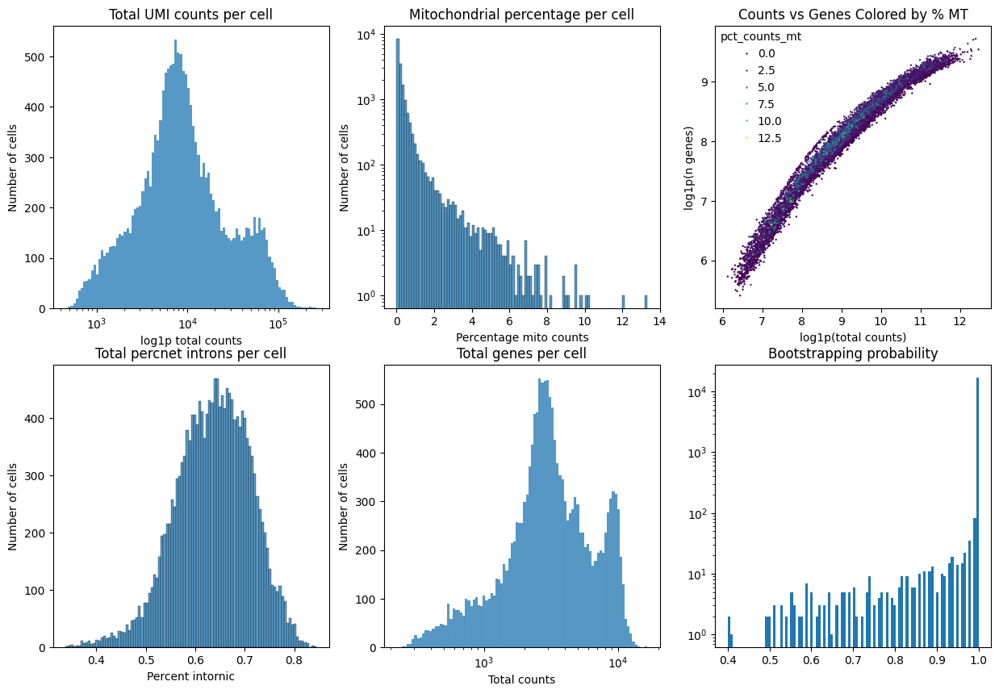

In [4]:
preprocessing.plot_qc_metrics(adata)

# Minimal Filter cells & genes

In [5]:
print(f"Starting: {adata.n_obs:,} cells\n")

# Calculate all filters (keep = pass filter)
filters = { # lists of boolen (True == to keep)
    
    'min_UMI': adata.obs["total_counts"] >= 500,
    'min_genes': adata.obs["n_genes_by_counts"] >= 300,
    'mt_threshold': adata.obs["pct_counts_mt"] <= 8,
    'percent_intronic_threshold': adata.obs["pct_intronic"] >= 0.25,
    'mapmycells_probs_class': (adata.obs['Class_bootstrapping_probability'] >= 0.5), # & (adata.obs['Class_correlation_coefficient'] >= 0.5),
    #'spatial_present': ~adata.obs.has_spatial,
}

# Print individual filter stats
n_start = len(adata)
for name, filt in filters.items():
    removed = (~filt).sum()
    print(f"{name:30s}: {removed:6,} removed ({100*removed/len(adata):5.1f}%)")

# Replace adata
cells_to_keep = pd.DataFrame(filters).all(axis=1)  # AND
adata = adata[cells_to_keep].copy()

print(f"Final: {adata.n_obs:,} / {n_start:,} cells retained ({100*adata.n_obs/n_start:.1f}%)")

Starting: 17,334 cells

min_UMI                       :      1 removed (  0.0%)
min_genes                     :     30 removed (  0.2%)
mt_threshold                  :     13 removed (  0.1%)
percent_intronic_threshold    :      0 removed (  0.0%)
mapmycells_probs_class        :      5 removed (  0.0%)


Final: 17,285 / 17,334 cells retained (99.7%)


In [6]:
# # Filter genes
# print(f"   Genes before filtering: {adata.n_vars}")
# sc.pp.filter_genes(adata, min_cells=3)
# print(f"   Genes after filtering: {adata.n_vars}")

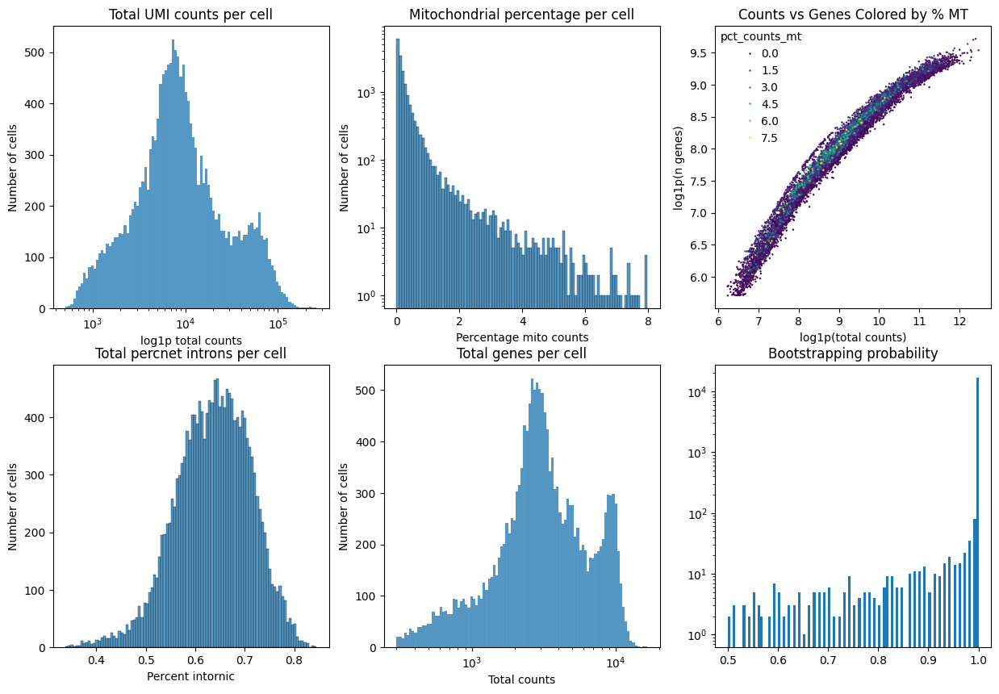

In [7]:
preprocessing.plot_qc_metrics(adata)

# Minimal Processing Pipeline (UMAP)

In [8]:
preprocessing.preprocess(adata, n_pcs_elbow=30, n_hvg=3000)
adata

Expect .X is raw counts!
Normalizing...


Findingn HVGs...
Scaling...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


Calculating PCA...
Calculating neighbors...
Calculating Umap...
Clutering...
Preprocessing done.


AnnData object with n_obs × n_vars = 17285 × 38606
    obs: 'x', 'y', 'pct_intronic', 'frac_contamination', 'dbscan_clusters', 'dbscan_score', 'sample', 'has_spatial', 'Neighborhood_label', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Neighborhood_correlation_coefficient', 'Class_label', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Class_correlation_coefficient', 'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Subclass_correlation_coefficient', 'Group_label', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Group_correlation_coefficient', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'Cluster_aggregate_probability', 'Cluster_correlation_coefficient', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes',

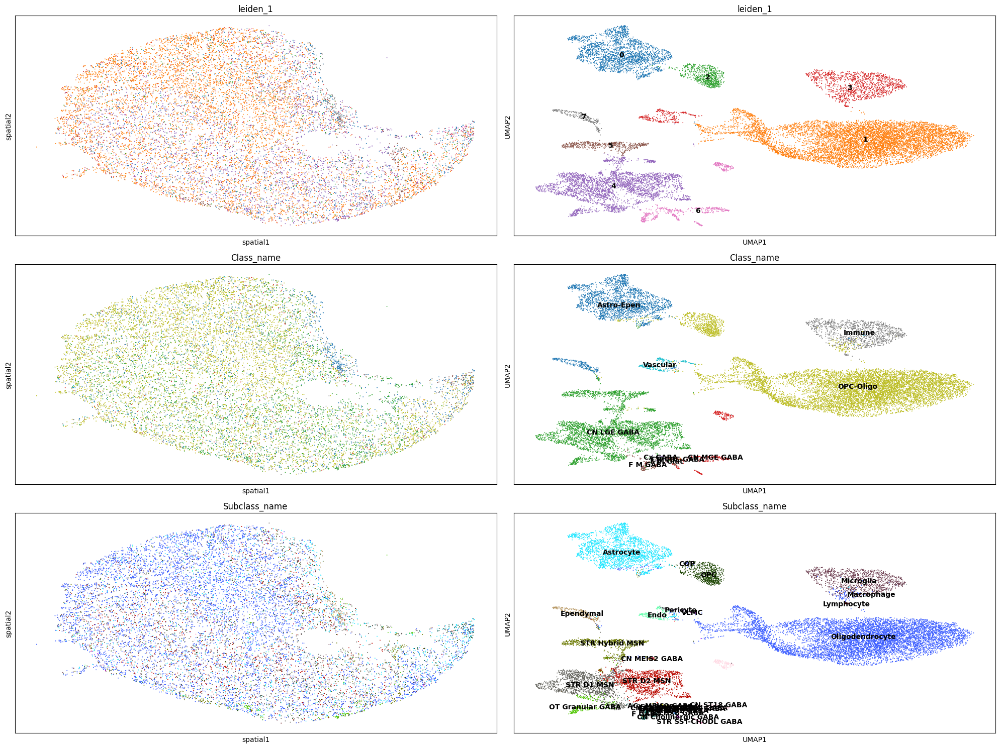

In [9]:
# Plor ledein clistering

fig, axes = plt.subplots(3, 2, figsize=(20, 15))
for i, res in enumerate(["leiden_1", "Class_name", "Subclass_name"]):
    sc.pl.embedding(adata, basis="spatial", color=res, ax=axes[i,0], show=False, legend_loc=None)
    sc.pl.umap(adata, color=res, ax=axes[i,1], show=False, legend_loc="on data")

plt.tight_layout()
plt.show()

# Remove Doublets

Find cells that express high score of a cell type outside of the cell type they belong


### Putative doublets by oligo + Astro + Microglia score

In [10]:
LEIDEN_LEVEL = "leiden_1"  # single leiden level for all three

CELLTYPE_CONFIG = {
    "astro": {
        "subclass_name": ["Astrocyte", "Ependymal", "VLMC", "Pericyte", "Endo"],
        "markers": ["GFAP", "AQP4", "ALDH1A1", "GINS3"],
        "cluster_thr": 0.4,   # min fraction to be a "real" cluster
        "score_thr":   0.2,   # AUCell score threshold for doublet flagging
    },
    "oligo": {
        "subclass_name": ["Oligodendrocyte"],
        "markers": ["MOG", "OLIG1", "OPALIN", "LGALS1", "PALM2", "PPM1G", "TRF"],
        "cluster_thr": 0.4,
        "score_thr":   0.2,
    },
    "micro": {
        "subclass_name": ["Microglia"],
        "markers": ["C1QA", "C1QB", "CX3CR1", "FCRLS", "P2RY12", "TREM2", "TMEM119"],
        "cluster_thr": 0.3,
        "score_thr":   0.2,
    },
}

# cinvertion dcit
name_to_id = dict(zip(adata.var["gene_symbol"], adata.var_names))



  Processing: ASTRO
  Markers: 4/4 found | Missing: []


  Score saved to adata.obs['score_aucell_astro']
leiden_1
0    0.443780
7    0.178829
3    0.079305
2    0.052341
1    0.031829
4    0.018651
6    0.011442
5    0.007350
  Real astro clusters: ['0']
  Doublets flagged: 346 (2.0% of cells)


/tmp/ipykernel_15554/3352257947.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(LEIDEN_LEVEL)[score_col]


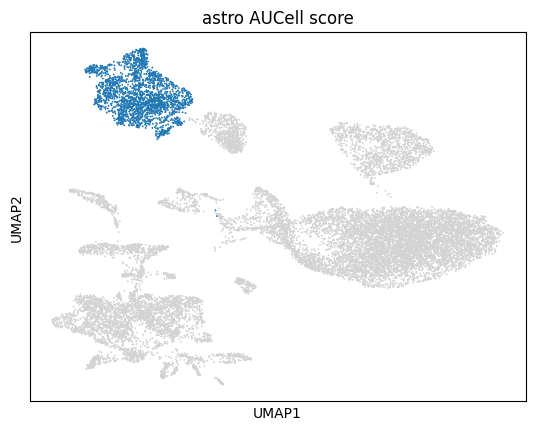

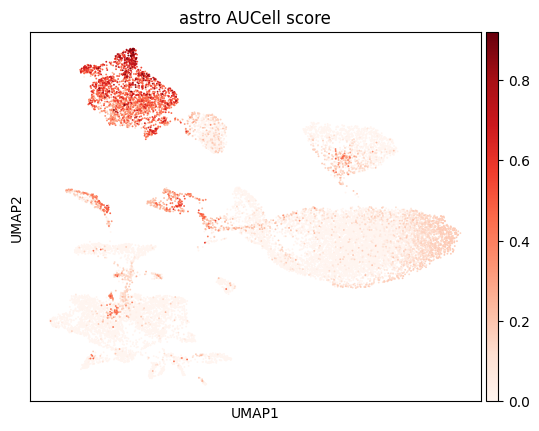

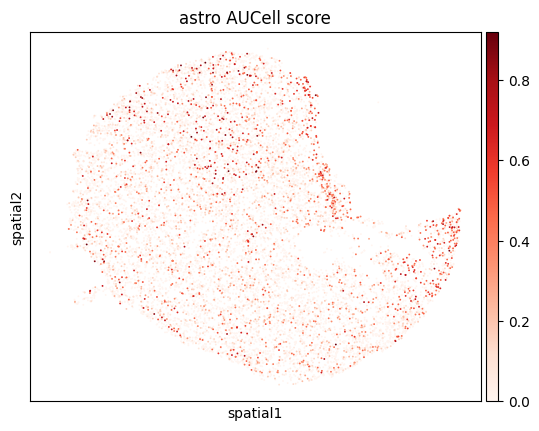

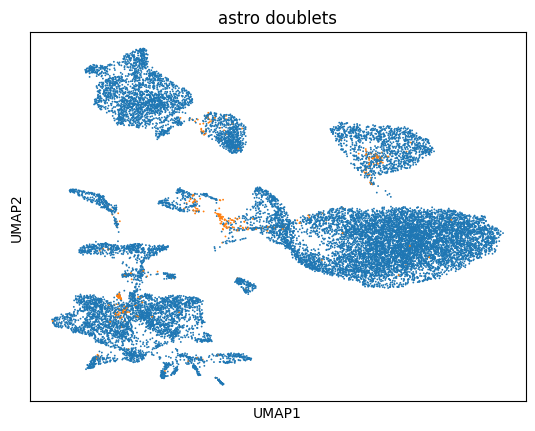


  Processing: OLIGO
  Markers: 5/7 found | Missing: ['PALM2', 'TRF']
  Score saved to adata.obs['score_aucell_oligo']
leiden_1
1    0.327596
2    0.099992
3    0.026570
7    0.022600
0    0.019013
4    0.010448
5    0.008316
6    0.005524
  Real oligo clusters: ['1']
  Doublets flagged: 130 (0.8% of cells)


/tmp/ipykernel_15554/3352257947.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(LEIDEN_LEVEL)[score_col]


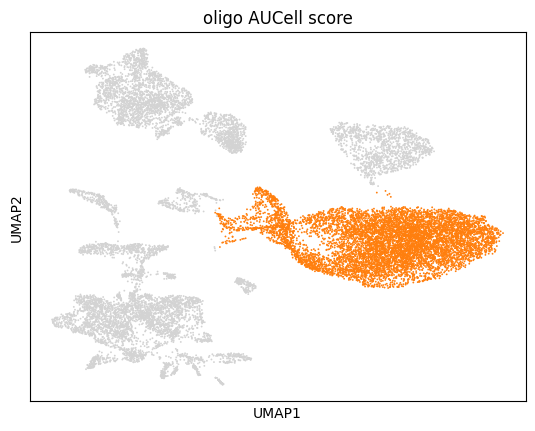

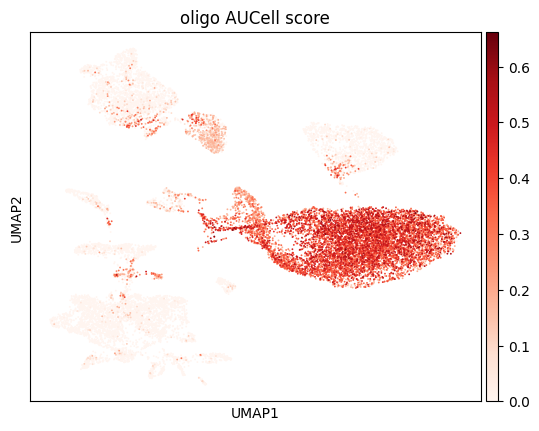

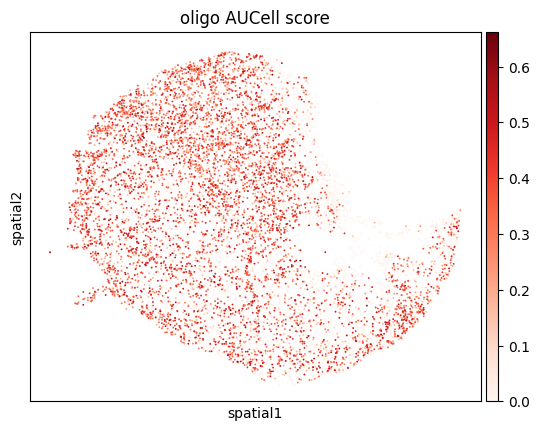

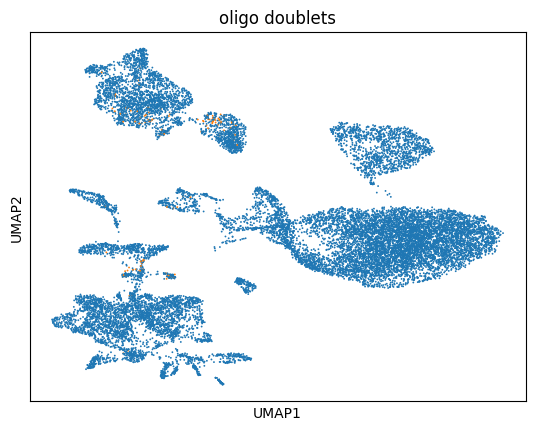


  Processing: MICRO
  Markers: 6/7 found | Missing: ['FCRLS']
  Score saved to adata.obs['score_aucell_micro']
leiden_1
3    0.202076
0    0.003784
2    0.002497
7    0.002380
6    0.001131
4    0.000892
5    0.000365
1    0.000153
  Real micro clusters: ['3']
  Doublets flagged: 10 (0.1% of cells)


/tmp/ipykernel_15554/3352257947.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(LEIDEN_LEVEL)[score_col]


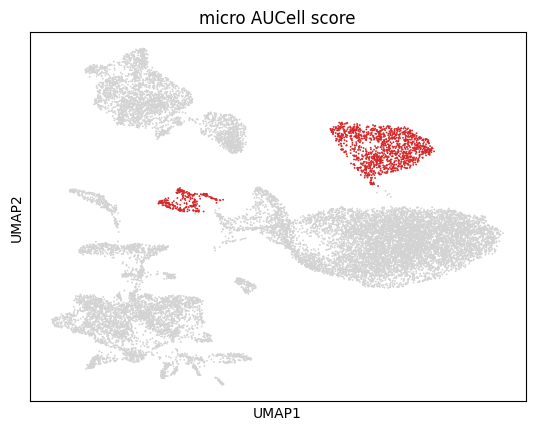

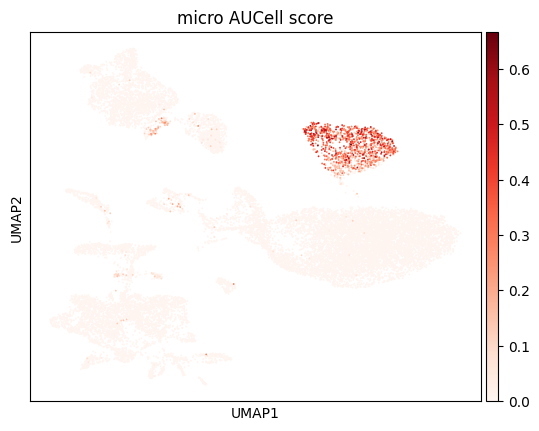

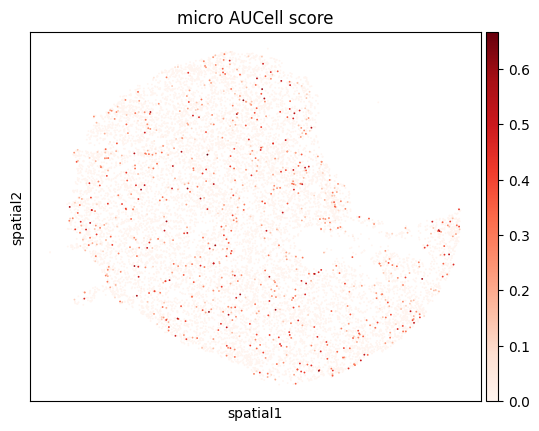

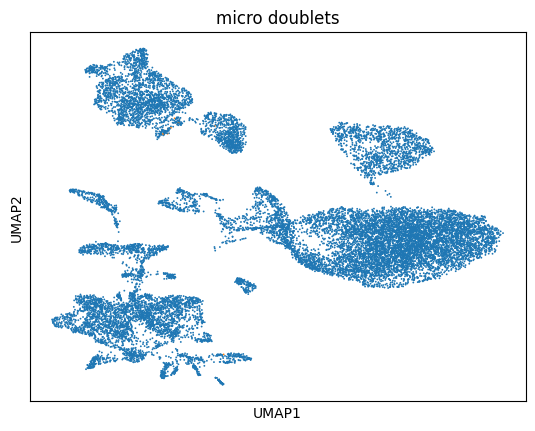

In [11]:
for ct, cfg in CELLTYPE_CONFIG.items():

    print(f"\n{'='*50}")
    print(f"  Processing: {ct.upper()}")
    print(f"{'='*50}")

    # -- 3a. Map gene symbols to var_names
    mapped   = [name_to_id[g] for g in cfg["markers"] if g in name_to_id]
    missing  = [g for g in cfg["markers"] if g not in name_to_id]
    print(f"  Markers: {len(mapped)}/{len(cfg['markers'])} found | Missing: {missing}")

    # -- 3b. AUCell scoring
    net = pd.DataFrame({"source": ct, "target": mapped, "weight": 1.0})
    dc.mt.aucell(data=adata, net=net, layer="counts", raw=False, verbose=False, tmin=3)
    score_col = f"score_aucell_{ct}"
    adata.obs[score_col] = adata.obsm["score_aucell"][ct].values
    del adata.obsm["score_aucell"]
    print(f"  Score saved to adata.obs['{score_col}']")

    # -- 3c. Detect real clusters (highest mean AUCell score)
    cluster_mean_score = (
        adata.obs
        .groupby(LEIDEN_LEVEL)[score_col]
        .mean()
        .sort_values(ascending=False)
    )
    print(cluster_mean_score.to_string())
    real_clusters = [cluster_mean_score.idxmax()]
    print(f"  Real {ct} clusters: {real_clusters}")


    # -- 3d. Flag doublets
    doublet_col = f"is_{ct}_doublet"
    adata.obs[doublet_col] = (
        (adata.obs[score_col] >= cfg["score_thr"]) &
        (~adata.obs[LEIDEN_LEVEL].isin(real_clusters)) &
        (~adata.obs["Subclass_name"].isin(cfg["subclass_name"]))  # preserve true cell types
    )
    n_doublets = adata.obs[doublet_col].sum()
    print(f"  Doublets flagged: {n_doublets} ({n_doublets/adata.n_obs*100:.1f}% of cells)")

    # -- 3e. Plots
    sc.pl.embedding(adata, color=LEIDEN_LEVEL,    groups=real_clusters, basis="umap",    legend_loc=None, title=f"{ct} AUCell score")
    sc.pl.embedding(adata, color=score_col,    basis="umap",    legend_loc=None, title=f"{ct} AUCell score", cmap="Reds")
    sc.pl.embedding(adata, color=score_col,    basis="spatial", legend_loc=None, title=f"{ct} AUCell score", cmap="Reds")
    sc.pl.embedding(adata, color=doublet_col,  basis="umap",    legend_loc=None, title=f"{ct} doublets")

### Rremove douibelts

In [12]:

adata.obs["is_doublet"] = adata.obs["is_oligo_doublet"] | adata.obs["is_astro_doublet"] | adata.obs["is_micro_doublet"]

print("\nDoublets distribution:")
print(adata.obs["is_doublet"].value_counts())
print("\nDoublets percentage:")
print(adata.obs["is_doublet"].value_counts().div(len(adata)))


Doublets distribution:
is_doublet
False    16804
True       481
Name: count, dtype: int64

Doublets percentage:
is_doublet
False    0.972172
True     0.027828
Name: count, dtype: float64


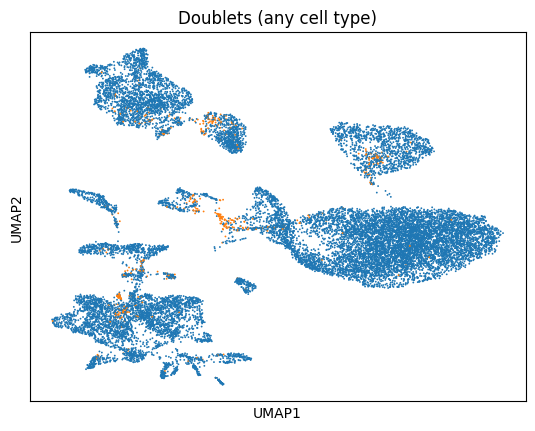

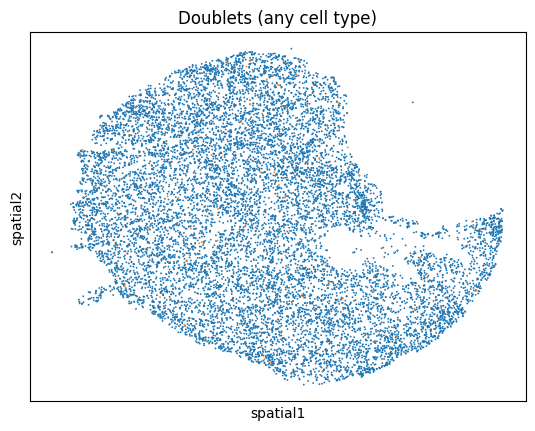

In [13]:
sc.pl.embedding(adata, color="is_doublet", basis="umap", legend_loc=None, title="Doublets (any cell type)")
sc.pl.embedding(adata, color="is_doublet", basis="spatial", legend_loc=None, title="Doublets (any cell type)")

In [14]:
adata = adata[~adata.obs["is_doublet"]].copy()

# Reprocess

In [15]:
# # now same genes coild be no more expressed
# sc.pp.filter_genes(adata, min_cells=3)

# ATTENTION: bring bacj count
adata.X = adata.layers["counts"].copy()

# recalutle qc metrics (ex count_per_cell)
adata.var["mt"] = adata.var.gene_symbol.str.startswith("MT-") # mitochondrial genes, ATTNETION: the names are in "gene_symbol"
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], inplace=True)


# Needed for plotting
#preprocessing.preprocess(adata, n_pcs_elbow=30, n_hvg=3000)

# Save

In [16]:
adata

AnnData object with n_obs × n_vars = 16804 × 38606
    obs: 'x', 'y', 'pct_intronic', 'frac_contamination', 'dbscan_clusters', 'dbscan_score', 'sample', 'has_spatial', 'Neighborhood_label', 'Neighborhood_name', 'Neighborhood_bootstrapping_probability', 'Neighborhood_aggregate_probability', 'Neighborhood_correlation_coefficient', 'Class_label', 'Class_name', 'Class_bootstrapping_probability', 'Class_aggregate_probability', 'Class_correlation_coefficient', 'Subclass_label', 'Subclass_name', 'Subclass_bootstrapping_probability', 'Subclass_aggregate_probability', 'Subclass_correlation_coefficient', 'Group_label', 'Group_name', 'Group_bootstrapping_probability', 'Group_aggregate_probability', 'Group_correlation_coefficient', 'Cluster_label', 'Cluster_name', 'Cluster_alias', 'Cluster_bootstrapping_probability', 'Cluster_aggregate_probability', 'Cluster_correlation_coefficient', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes',

In [17]:
SAVE_PATH = f'{BASE_PATH}/SlideTags_single_libraries/{SAMPLE_ID}/{BCL}/{LIBRARY}/adata/doublets_filtered_adata.h5ad'
print(f"Saving filtered adata to: {SAVE_PATH}")
adata.write(SAVE_PATH)

Saving filtered adata to: /home/gdallagl/myworkdir/data/XDP/SlideTags_single_libraries/sample_09/240911_SL-EXD_0362_A22FLV2LT4/SI-TT-E8/adata/doublets_filtered_adata.h5ad


In [18]:
STOP

NameError: name 'STOP' is not defined

# Plots

### Ivestigate PCs

In [ ]:
#preprocessing.show_top_pc_genes(adata, n_pcs=3, top_n=10)

### Spatial clusters

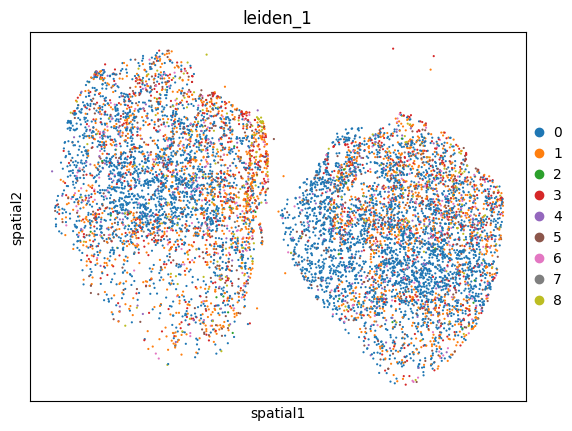

In [ ]:
sc.pl.embedding(adata, basis="spatial", color="leiden_1")

### Cell Types

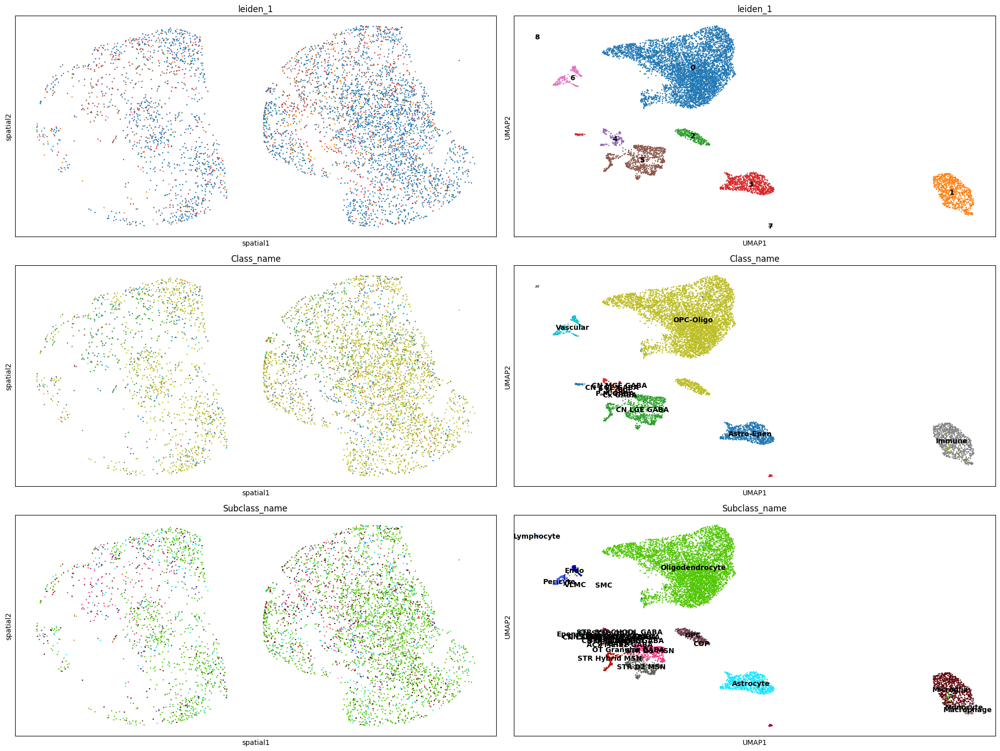

In [ ]:
# Plor ledein clistering

fig, axes = plt.subplots(3, 2, figsize=(20, 15))
for i, res in enumerate(["leiden_1", "Class_name", "Subclass_name"]):
    sc.pl.embedding(adata, basis="spatial", color=res, ax=axes[i,0], show=False, legend_loc=None)
    sc.pl.umap(adata, color=res, ax=axes[i,1], show=False, legend_loc="on data")

plt.tight_layout()
plt.show()

### QC metrics on umap

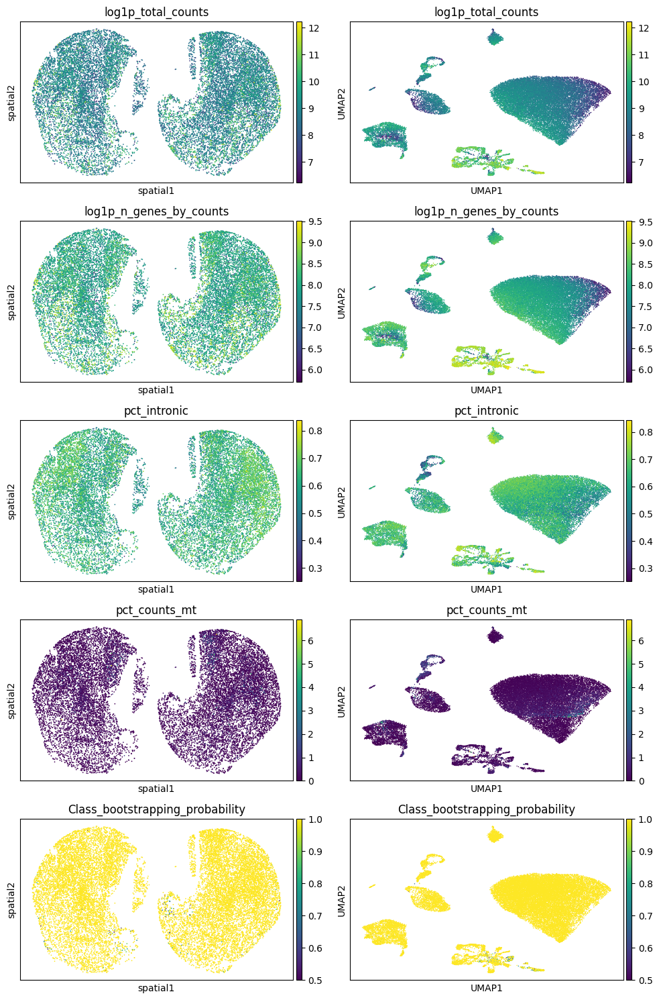

In [ ]:
fig, axes = plt.subplots(5, 2, figsize=(10, 15))

adata_spatial = ad.AnnData(X=csr_matrix(adata.X.shape),obs=adata.obs.copy(),var=adata.var.copy(),uns=adata.uns.copy(),obsm=adata.obsm.copy())
adata_spatial = adata_spatial[adata_spatial.obs.has_spatial]

for i, res in enumerate(["log1p_total_counts", "log1p_n_genes_by_counts", "pct_intronic", "pct_counts_mt", "Class_bootstrapping_probability"]):
    sc.pl.embedding(adata_spatial, basis="spatial", color=res, ax=axes[i,0], show=False, legend_loc=None)
    sc.pl.umap(adata, color=res, ax=axes[i,1], show=False, legend_loc=None)

plt.tight_layout()
plt.show()

### Cell type markers

In [ ]:
markers = {
    # Non-neuronal cells
    'Astrocyte': ['GFAP', 'AQP4', 'GINS3'],
    
    'Ependymal': ['ZBBX'],
    
    'Endothelial': ['DCN', 'FLT1'],
    
    'Lymphocyte': ['SKAP1', 'THEMIS'],
    
    'Microglia': ['CX3CR1', 'P2RY12', 'C1QA', 'C1QB', 'C1QC'],
    
    'Macrophage': ['CD163', 'CD200R1'],
    
    'Oligodendrocyte': ['TF', 'PLP1', 'MOBP', 'TMEM144'], #['MOBP', 'TF', 'PLP1'],#'SHROOM4', 'TF'], MBP
    
    'OPC': ['VCAN', 'PDGFRA'],
    
    # Neurons - using ONLY subtype-specific markers (no RBFOX3/SYT1 overlap)
    'Neuron_inhibitory': ['GAD1', 'GAD2', 'SLC32A1'],
    
    'Neuron_excitatory': ['SLC17A6', 'SLC17A7', 'SLC17A8'],
    
    'Neuron_dopaminergic': ['SLC6A3', 'TH'],
    
    'Neuron_cholinergic': ['CHAT'],
    
    'Neuron_serotonergic': ['SLC6A4'],
}

mapping_genes_name_dict = adata.var[["gene_symbol"]].to_dict()["gene_symbol"].copy()
symbol_to_varid = {v.upper(): k for k, v in mapping_genes_name_dict.items() if isinstance(v, str)}
translated_markers = {
    celltype: [symbol_to_varid.get(gene.upper(), None) for gene in genes]
    for celltype, genes in markers.items()
}

display(translated_markers)


{'Astrocyte': ['ENSG00000131095', 'ENSG00000171885', 'ENSG00000181938'],
 'Ependymal': ['ENSG00000169064'],
 'Endothelial': ['ENSG00000011465', 'ENSG00000102755'],
 'Lymphocyte': ['ENSG00000141293', 'ENSG00000172673'],
 'Microglia': ['ENSG00000168329',
  'ENSG00000169313',
  'ENSG00000173372',
  'ENSG00000173369',
  'ENSG00000159189'],
 'Macrophage': ['ENSG00000177575', 'ENSG00000163606'],
 'Oligodendrocyte': ['ENSG00000091513',
  'ENSG00000123560',
  'ENSG00000168314',
  'ENSG00000164124'],
 'OPC': ['ENSG00000038427', 'ENSG00000134853'],
 'Neuron_inhibitory': ['ENSG00000128683',
  'ENSG00000136750',
  'ENSG00000101438'],
 'Neuron_excitatory': ['ENSG00000091664',
  'ENSG00000104888',
  'ENSG00000179520'],
 'Neuron_dopaminergic': ['ENSG00000142319', 'ENSG00000180176'],
 'Neuron_cholinergic': ['ENSG00000070748'],
 'Neuron_serotonergic': ['ENSG00000108576']}

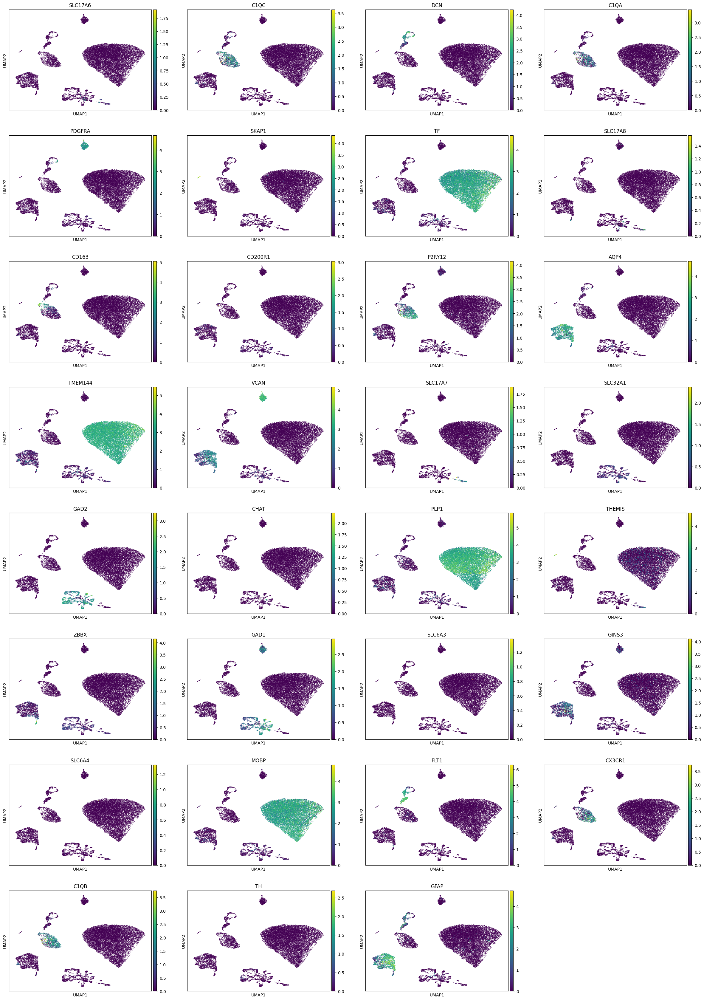

In [ ]:
gene_to_plot = set()
for key, item in markers.items():
    gene_to_plot.update(set(item))
    
sc.pl.umap(adata, color=gene_to_plot, cmap='viridis', ncols=4, gene_symbols="gene_symbol", layer="log1p_norm")#, vmin=-1, vmax=1)


## Plot Module score markers

  0%|          | 0/13 [00:00<?, ?it/s]

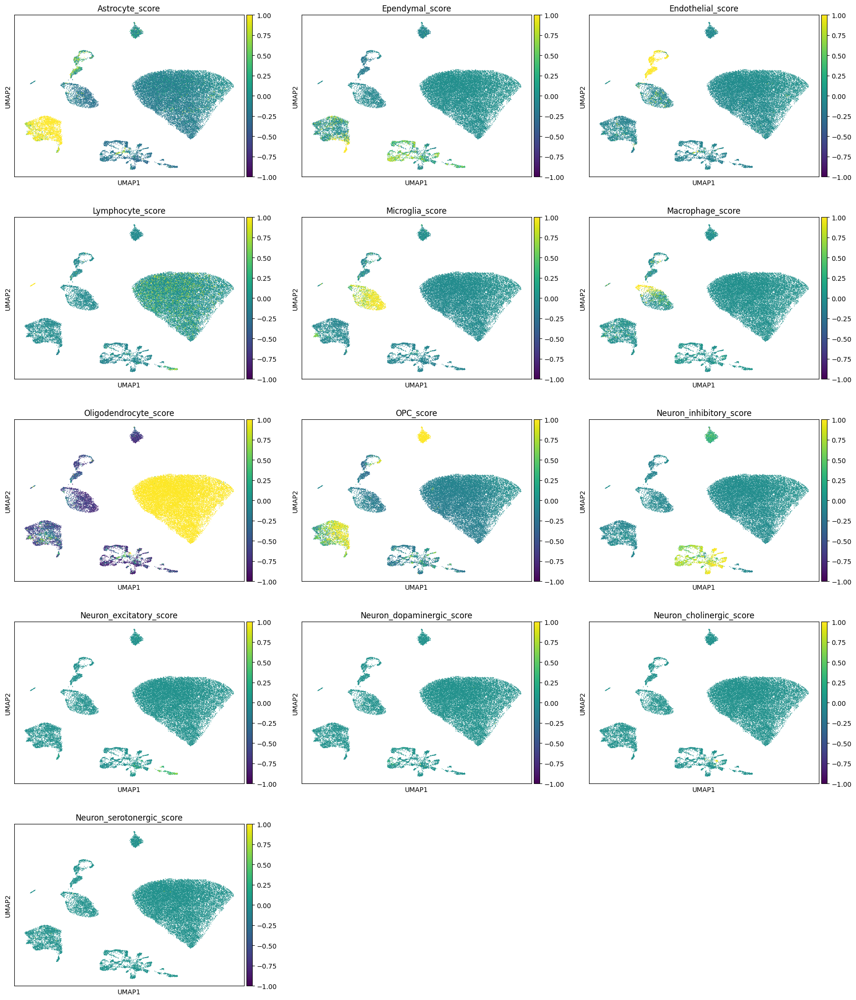

In [ ]:
for cell_type, genes in tqdm(translated_markers.items()):
    # Only use genes that exist in your data
    #genes_available = [g for g in genes if g in adata.var.gene_symbol.to_list()]
    
    if len(genes) > 0:
        #print(f"  {cell_type}: {len(genes)} markers")
        sc.tl.score_genes(adata, genes, score_name=f'{cell_type}_score', use_raw=False, layer="log1p_norm") # normalised scores (not scaled)
    else:
        print(f"  ⚠ {cell_type}: No markers found!")

# plot umaps
score_cols = [f'{ct}_score' for ct in markers.keys() if f'{ct}_score' in adata.obs]
sc.pl.umap(adata, color=score_cols, cmap='viridis', ncols=3, vmin=-1, vmax=1)

### Plot Neun Markers

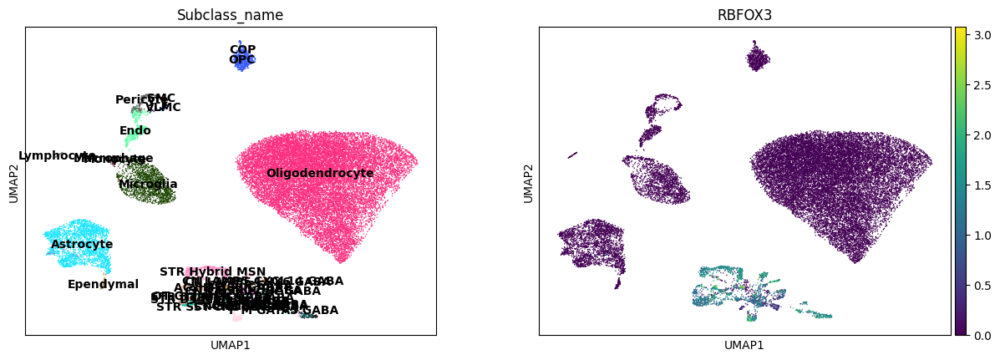

In [ ]:
sc.pl.umap(adata, color=['Subclass_name', 
                         'RBFOX3', 
                         ], gene_symbols="gene_symbol", ncols=3, legend_loc="on data", layer="log1p_norm")

### Cell Type distribution on Umap/spatial

In [ ]:
ANNOTATION_LEVEL = "Subclass_name"

### Overall distribution

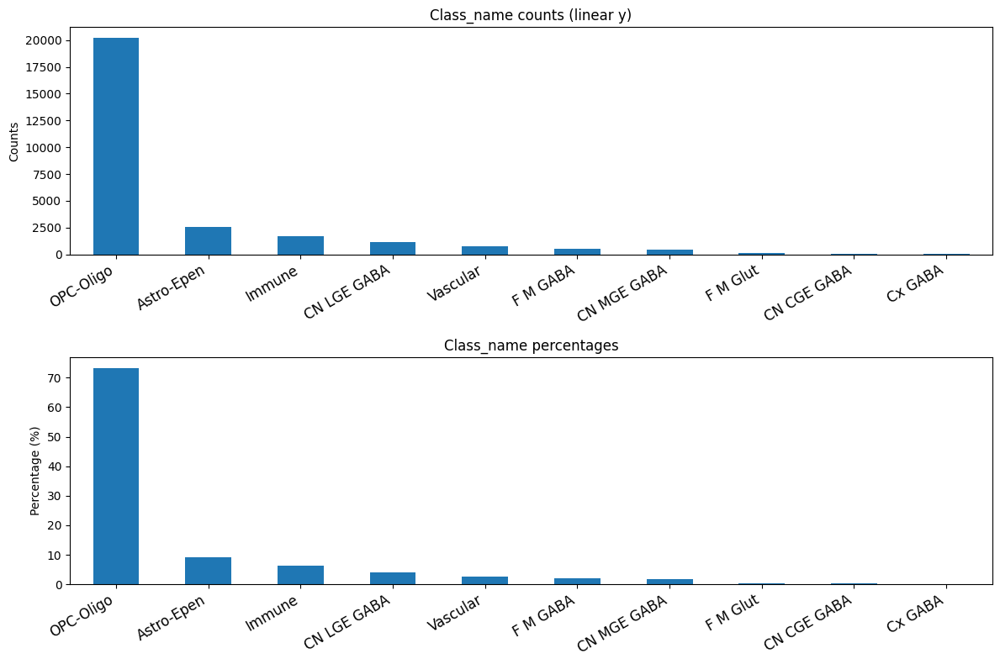

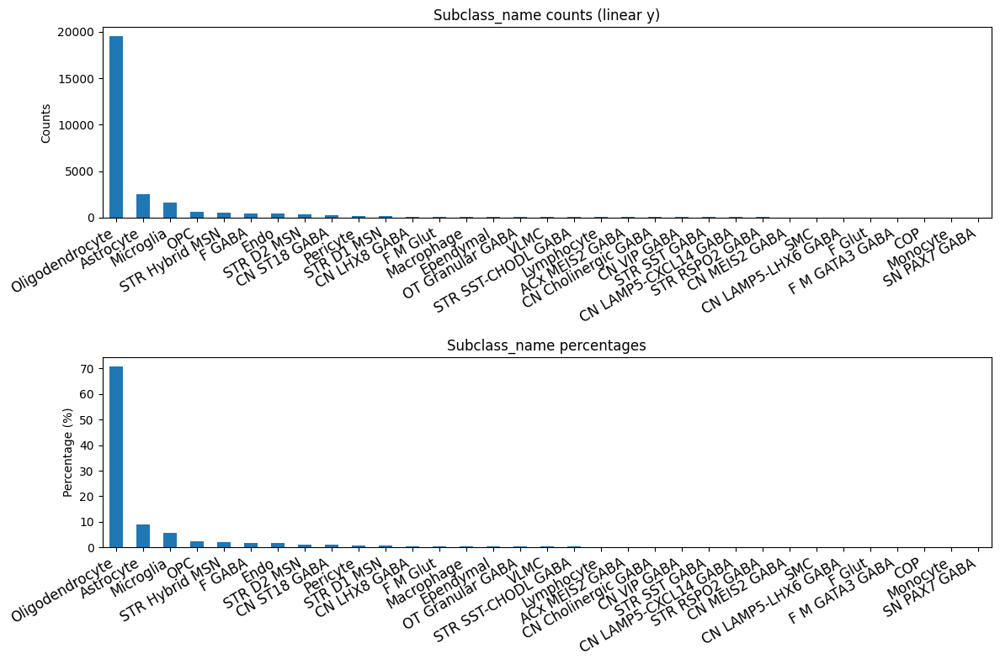

In [ ]:
preprocessing.plot_cell_type_distribution(adata, annotation_levels=["Class_name", "Subclass_name"])

### UMI distribution

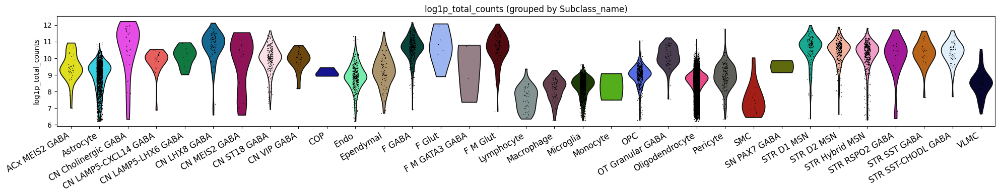

In [ ]:
metrics = [
    "log1p_total_counts",
    # "n_genes_by_counts",
    # "pct_intronic",
    # "pct_counts_mt",
    # "Class_bootstrapping_probability"
]

fig2, axes2 = plt.subplots(
    nrows=len(metrics),
    ncols=1,
    figsize=(20, 4 * len(metrics))
)
if len(metrics) == 1:
    axes2 = [axes2]

for i, key in enumerate(metrics):
    sc.pl.violin(
        adata,
        keys=key,
        groupby=ANNOTATION_LEVEL,
        rotation=30,
        ax=axes2[i],
        show=False
    )
    axes2[i].set_title(f"{key} (grouped by {ANNOTATION_LEVEL})")
    for label in axes2[i].get_xticklabels():
        label.set_horizontalalignment("right")
        label.set_fontsize(12)


plt.tight_layout()
plt.show()

# ---
# ---
# ---

In [ ]:
STOP

NameError: name 'STOP' is not defined

# Remove Doublets clusters

excluding cell clusters that co-express marker genes of distinct cell types (not UMI based approach).

Problem: Homotypic doublets (formed by transcriptionally similar cells) cannot be detected this way

Check if the doublet cluster is positioned between its "parent" clusters in UMAP space


## Putative doublets by mix cell types

In [ ]:
# cluster_level_for_mix = "leiden_5"
# cell_type_annotation_for_mix = "Subclass_name"

# # Calcualte high res clusters
# sc.tl.leiden(adata, resolution=10.0, key_added="leiden_5", flavor="igraph", n_iterations=2)

In [ ]:
# fig, axes = plt.subplots(5, 1, figsize=(15, 25))

# # Row 1: Cell type annotations
# sc.pl.umap(adata, color="Group_name", ax=axes[0], show=False, 
#            legend_fontsize=6, size=10, legend_loc="on data", 
#            title="Subclass_name")

# # Rows 2-4: QC metrics (one per row)
# sc.pl.umap(adata, color='pct_counts_mt', ax=axes[1], show=False, size=10, vmax=2)
# sc.pl.umap(adata, color='n_genes_by_counts', ax=axes[2], show=False, size=10)
# sc.pl.umap(adata, color='log1p_total_counts', ax=axes[3], show=False, size=10)

# # Row 5: Leiden clusters
# num_clusters = adata.obs[cluster_level_for_mix].nunique()
# cmap = plt.get_cmap("tab20")
# palette = [cmap(i / num_clusters) for i in range(num_clusters)]
# sc.pl.umap(adata, color=cluster_level_for_mix, ax=axes[4], show=False, 
#            legend_fontsize=8, size=10, legend_loc="on data", 
#            palette=palette, title=cluster_level_for_mix)

# plt.tight_layout()
# plt.show()

In [ ]:
# # Get composition (proportions per cluster)
# cluster_composition = pd.crosstab(
#     adata.obs[cluster_level_for_mix], 
#     adata.obs[cell_type_annotation_for_mix],
#     normalize='index'
# )

# # Calculate entropy per cluster
# from scipy.stats import entropy
# cluster_entropy = cluster_composition.apply(lambda row: entropy(row.values), axis=1)

# # Propose high ebtrupy clusters
# thr = cluster_entropy.quantile(0.85)
# high_entropy_clusters = cluster_entropy[cluster_entropy > thr].sort_values(ascending=False).index.to_list()
# print("Proposed mixed clusters (high entropy):", high_entropy_clusters )

# fig, axes = plt.subplots(1, 1, figsize=(10, 8))
# sc.pl.umap(adata, color="leiden_5", show=False, legend_fontsize=14, size=10, legend_loc="on data", palette=palette, groups=high_entropy_clusters, ax=axes)
# plt.show()

# # Plot distruvtion
# fig, axes = plt.subplots(1, 2, figsize=(12, 3))
# # Entropy histogram
# axes[0].hist(cluster_entropy, bins=20, edgecolor='black', color='steelblue')
# axes[0].axvline(1.0, color='red', linestyle='--', label='Suggested threshold')
# axes[0].set_xlabel('Cluster Entropy')
# axes[0].set_ylabel('Number of Clusters')
# axes[0].set_title('Cluster Heterogeneity (Entropy)')
# axes[0].legend()
# # Bar plot of entropy per cluster
# cluster_entropy.sort_values(ascending=False).plot(kind='bar', ax=axes[1], color='steelblue')
# axes[1].axhline(thr, color='red', linestyle='--', alpha=0.7)
# axes[1].set_xlabel('Cluster')
# axes[1].set_ylabel('Entropy')
# axes[1].set_title('Entropy per Cluster (sorted)')
# axes[1].tick_params(axis='x', rotation=90)
# plt.tight_layout()
# plt.show()


In [ ]:
# # Manually chosen
# print("MANUALLY CHOOSE VERY NOISY CLUSTERS TO REMOVE!")
# MIXED_CLUSTERS = []

# #
# adata.obs['cluster_entropy'] = adata.obs[cluster_level_for_mix].map(cluster_entropy)
# adata.obs['is_mixed_cluster_doublet'] = adata.obs[cluster_level_for_mix].isin(MIXED_CLUSTERS)

# print("\nDoublets distribution:")
# print(adata.obs["is_mixed_cluster_doublet"].value_counts())
# print("\nDoublets percentage:")
# doublets_mix_pct = (
#     adata.obs["is_mixed_cluster_doublet"]
#     .value_counts(normalize=True)
#     .get(True, 0) 
# )
# print(doublets_mix_pct)

# fig, axes = plt.subplots(1, 2, figsize=(18, 7))
# sc.pl.umap(adata, color='cluster_entropy', ax=axes[0], show=False,
#            cmap='Reds', title='Cluster Entropy (UMAP)')
# sc.pl.umap(adata, color='is_mixed_cluster_doublet', ax=axes[1], show=False,
#            title='Mixed cluster doublets')
# plt.tight_layout()
# plt.show()

## Putative Doublets by gene Markers

Find gene makers (DEGs) for each cluster and see if they are ibtersection with makrher genes of a specific cell type.

If they overlap wiht more than 2 cell types they coudl be doublets.

In [ ]:
# # Find marker genes for each cluster (equivalent to FindAllMarkers)
#     # need log normlsied data --< NPY scaled
#     # DEG: cluster Vs rest
# sc.tl.rank_genes_groups(
#     adata, 
#     groupby=CLUSTER_LEVEL, 
#     method='wilcoxon', 
#     reference="rest", 
#     corr_method="benjamini-hochberg",
#     use_raw=False, 
#     layer="log1p_norm", #ATTNETION: NOT scaled data in X
#     pts = True, # ATTENTION; % cells expressing gene IN and OUT cluster 
# )

In [ ]:
# # Get top genes as DataFrame
# top_n = 300
# doublet_clusters_markers = {}

# for cluster in tqdm(adata.obs[CLUSTER_LEVEL].cat.categories):

#     # Get top genes for this cluster
#     df = sc.get.rank_genes_groups_df(adata, group=cluster) # sorted by score

#     df = df[
#         (df.pvals_adj < 0.05) &
#         (df.logfoldchanges > 1) &
#         (df.scores > 0) &
#         (df['pct_nz_group'] > 0.25) &  # only test genes that are detected in a minimum fraction  IN cluster
#         # (df['pct_nz_reference'] < 0.50) & # only test genes NOT expressed outside
#         # ((df['pct_nz_group'] - df['pct_nz_reference']) > 0.10) # Gene must be >10% more frequent in cluster than outside  
#     ] 


#     #display(df)
#     top_genes = set(df.head(top_n)['names'].tolist())
#     #print(top_genes)

#     # check if these top genes overlpa wiht one of the gene list of a specific cell type
#     cell_types_found = {}
#     for cell_type, cell_type_markers in translated_markers.items(): # ATTENTION: gene name
#         overlap = top_genes & set(cell_type_markers)
#         if len(overlap) != 0:
#             cell_types_found[cell_type] = list(overlap)

#     if len(cell_types_found.keys()) >= 2:
#         doublet_clusters_markers[cluster] = list(cell_types_found.keys())


# display(doublet_clusters_markers)


# fig, axes = plt.subplots(1, 2, figsize=(12, 5))
# for ax, g in zip(axes, [list(doublet_clusters_markers.keys()), 
#                     ['6', '7', '11', '12', '22', '29', '33', '34', '36', '48', '50', '52', '54', '55', '58']]# clusters with very differt cell types
#                     ): 
#     sc.pl.embedding(adata, basis="X_umap", color="leiden_4", legend_loc="on data",
#                     groups=g, ax=ax, show=False, return_fig=False)
# plt.tight_layout(); plt.show()




## Putative Doublets by Module score and Entropy

FOr each cell tyope marker genes lists, calculate the relative module socre (for each cell).

Calculate mean module score for each cluster for each module.

Claulte Entropy of these menas per cluster.

CLusters wiht high entropy (mix of modules) are doublets.

In [ ]:
# import numpy as np
# from scipy.stats import entropy

# # Get all module score columns
# score_cols = [f'{ct}_score' for ct in markers.keys() if f'{ct}_score' in adata.obs]

# # Extract score matrix (cells × cell_types)
# score_matrix = adata.obs[score_cols].values

# # Shift to positive and normalize
# score_matrix = score_matrix - score_matrix.min(axis=1, keepdims=True) + 0.01
# score_matrix = score_matrix / score_matrix.sum(axis=1, keepdims=True)

# # Calculate entropy for each cell (vectorized)
# adata.obs['module_entropy'] = entropy(score_matrix.T)  # Transpose for scipy

# # Flag high-entropy cells as doublets
# threshold = np.percentile(adata.obs['module_entropy'], 85)  # Top 15%
# adata.obs['is_entropy_doublet'] = adata.obs['module_entropy'] > threshold

# # Results
# print(f"Entropy threshold: {threshold:.3f}")
# print(f"Entropy doublets: {adata.obs['is_entropy_doublet'].sum():,} ({adata.obs['is_entropy_doublet'].sum()/len(adata)*100:.1f}%)")

# # Visualize
# sc.pl.umap(adata, color=['module_entropy', 'is_entropy_doublet'], cmap='Reds', ncols=2)

In [ ]:
# # plot moduels per cluster
# # Get mean scores per cluster
# cluster_scores = adata.obs.groupby(CLUSTER_LEVEL, observed=False)[score_cols].mean()

# # Clean column names
# cluster_scores.columns = [c.replace('_score', '') for c in cluster_scores.columns]

# # Simple barplot - one per cluster
# n_clusters = len(cluster_scores)
# ncols = 6
# nrows = int(np.ceil(n_clusters / ncols))

# fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 3*nrows))
# axes = axes.flatten() if n_clusters > 1 else [axes]

# for idx, (cluster, row) in enumerate(cluster_scores.iterrows()):
#     ax = axes[idx]
    
#     # Sort values for easier reading
#     sorted_data = row.sort_values(ascending=True)
    
#     # Plot
#     ax.barh(range(len(sorted_data)), sorted_data.values, color='steelblue')
#     ax.set_yticks(range(len(sorted_data)))
#     ax.set_yticklabels(sorted_data.index, fontsize=8)
#     ax.set_xlabel('Mean Module Score', fontsize=9)
#     ax.set_title(f'Cluster {cluster}', fontweight='bold')
#     ax.axvline(0, color='black', linestyle='--', linewidth=0.8)
#     ax.grid(axis='x', alpha=0.3)
#     ax.set_xlim((-0.2, 1))
#     ax.axvline(0.4, linestyle='--', linewidth=1, color="red")

# # Hide empty subplots
# for idx in range(n_clusters, len(axes)):
#     axes[idx].axis('off')

# plt.tight_layout()
# plt.show()

In [ ]:
# from scipy.stats import entropy

# # Calculate entropy for each cluster (higher = more mixed)
# cluster_scores_entropy = cluster_scores.copy()
# cluster_scores_entropy['entropy'] = cluster_scores.apply(
#     lambda x: entropy(x[x > 0] / x[x > 0].sum()) if (x > 0).sum() > 1 else 0,  # clauclte onyl for vlaues bogger than 0
#     axis=1
# )

# # Flag top 25% as potential doublets
# threshold = cluster_scores_entropy['entropy'].quantile(0.75)
# high_entropy_clusters = cluster_scores_entropy[cluster_scores_entropy['entropy'] > threshold]

# # Plot
# cluster_scores_entropy['entropy'].sort_values(ascending=False).plot(
#     kind='bar', figsize=(12, 5), color='steelblue', title='Cluster Entropy'
# )
# plt.axhline(threshold, color='red', linestyle='--', label=f'Threshold: {threshold:.2f}')
# plt.ylabel('Entropy (higher = doublet)')
# plt.legend()
# plt.tight_layout()
# plt.show()

# # Create doublet dictionary: cluster -> cell types with high scores
# doublet_clusters_entropy = {}
# for cluster in high_entropy_clusters.index:
#     scores = cluster_scores_entropy.loc[cluster].drop('entropy')
#     # Get cell types with scores > 0.3
#     threshold = scores.quantile(0.75) 
#     active_types = scores[scores > threshold].sort_values(ascending=False)
#     if len(active_types) >= 2:
#         doublet_clusters_entropy[cluster] = active_types.index.tolist()

# # Display results
# print("Entropy-based doublet clusters:")
# display(doublet_clusters_entropy)

# # Plot
# fig, axes = plt.subplots(1, 2, figsize=(12, 5))
# for ax, clusters in zip(axes, [list(doublet_clusters_entropy.keys()), 
#                                ['3', '5', '11', '12', '15', '19', '22', '32', '33', '45', '49', '52', '54', '55', '58']]):
#     sc.pl.embedding(adata, basis="X_umap", color="leiden_4", legend_loc="on data",
#                     groups=clusters, ax=ax, show=False)
# plt.tight_layout()
# plt.show()

## Putative Doublets by Oligo Module score

In [ ]:
# score_col_oligo = "Oligodendrocyte_score"
# cluster_col = "leiden_2" # need broad clustering
# P_VALUE_THRESHOLD = 0.05

In [ ]:
# # Define clusters wiht real oligos
# sc.pl.umap(adata, color=[score_col_oligo, cluster_col], gene_symbols="gene_symbol", ncols=2, legend_loc="on data")

# REAL_OLIGO_CLUSTERS = ["11", "12", "13"]

In [ ]:
# # define doublets by oligo score
#     # 1) they are not real oligos (not in REAL_OLIGO_CLUSTERS)
#     # 2) their oligo score is above the threshold 
#         # defined for their cluster ?
#         # mean of all thresholds --> OK

# # if want to use mean thr
# #mean_threshold = results_df[(results_df['Is_Bimodal']) & (~results_df["Cluster"].isin(REAL_OLIGO_CLUSTERS))]['Threshold'].mean()

# # if want to use constant one
# mean_threshold = 0.5 #results_df[(results_df['Is_Bimodal']) & (~results_df["Cluster"].isin(REAL_OLIGO_CLUSTERS))]['Threshold'].mean()

# print("Mean thr: ", mean_threshold)

# adata.obs["is_oligo_doublet"] = [
#     (adata.obs.loc[cell, score_col_oligo] >= mean_threshold)
#     and (adata.obs.loc[cell, cluster_col] not in REAL_OLIGO_CLUSTERS)
#     for cell in adata.obs_names
# ]

# # if we want to use cluster-specific thresholds
# # adata.obs['cluster_threshold'] = adata.obs[cluster_col].map(thresholds_dict)
# # adata.obs["is_oligo_doublet"] = (
# #     ~adata.obs[cluster_col].isin(REAL_OLIGO_CLUSTERS) &  # NOT real oligo
# #     (adata.obs[score_col_oligo] >= adata.obs['cluster_threshold'])  # Above CLUSTER-SPECIFIC threshold
# # )

# print("\nDoublets distribution:")
# print(adata.obs["is_oligo_doublet"].value_counts())
# print("\nDoublets percentage:")
# doublets_oligo_pct = (
#     adata.obs["is_oligo_doublet"]
#     .value_counts(normalize=True)
#     .loc[True]
# )
# print(doublets_oligo_pct)

# sc.pl.umap(adata, color=[score_col_oligo, 'is_oligo_doublet', cluster_col], gene_symbols="gene_symbol", ncols=3, legend_loc=None)


In [ ]:
# # Goal: find a good doblet rate estimation to give to scorublet

# # reconsctct total doublets rate
#     #p_oligo = proportion of oligos in your sample
# p_oligo = (adata.obs.Subclass_name == "Oligodendrocyte").sum() / len(adata)
# print(f"Proportion of Oligos: {p_oligo:.3f}")
# predicted_total_doublet_rate_by_oligo = doublets_oligo_pct / (2 * p_oligo * (1 - p_oligo))
#      # ATTENTION: it doesnt takes into account homotopyc doublets

# print(predicted_total_doublet_rate_by_oligo)

Proportion of Oligos: 0.510
0.0344953418392423


## Putative Doublets by Scrublet

In [ ]:
# import scrublet as scr

# counts = adata.layers['counts'].copy()

# scrub = scr.Scrublet(
#     counts,
#     expected_doublet_rate=predicted_total_doublet_rate_by_oligo,  # Use prior estimate 
#     sim_doublet_ratio=2
# )

# doublet_scores, predicted_doublets = scrub.scrub_doublets(
#     min_counts=2,
#     min_cells=3,
#     min_gene_variability_pctl=85,
#     n_prin_comps=30
# )

# # if you want spefic thr
# # THR_SCRUBLET = 0.27  # set based on histogram inspection
# # scrub.call_doublets(threshold=THR_SCRUBLET, verbose=False)
# # predicted_doublets = scrub.predicted_doublets_

# # Plot to find natural separation
# scrub.plot_histogram()


In [ ]:
# # store in adata
# adata.obs['scrublet_score'] = doublet_scores
# adata.obs['is_scrublet_doublet'] = predicted_doublets

# # calculate
# total_doublet_rate_by_scrublet = predicted_doublets.sum() / len(predicted_doublets)
# print(total_doublet_rate_by_scrublet)

# # Plot overlap
# # sc.pl.umap(adata, color='is_oligo_doublet', show=False, 
# #            title=f'Oligo doublets ({predicted_total_doublet_rate_by_oligo*100:.1f}%)')
# sc.pl.umap(adata, color='is_scrublet_doublet', show=False,
#            title=f'Scrublet doublets ({total_doublet_rate_by_scrublet*100:.1f}%)')

## Cell Type distribution by cluster

In [ ]:
# preprocessing.plot_cell_type_distribution_per_cluster(adata, ANNOTATION_LEVEL="Class_name", CLUSTER_LEVEL=CLUSTER_LEVEL)
# preprocessing.plot_cell_type_distribution_per_cluster(adata, ANNOTATION_LEVEL="Subclass_name", CLUSTER_LEVEL=CLUSTER_LEVEL)
# preprocessing.plot_cell_type_distribution_per_cluster(adata, ANNOTATION_LEVEL="my_hierarchy_all", CLUSTER_LEVEL=CLUSTER_LEVEL)

# Save Notebook

In [ ]:
# Get the notebook path
notebook_path = str(ipynbname.path())
print(f"Current notebook: {notebook_path}")

# Save it
base_name = os.path.basename(notebook_path).replace('.ipynb', '')  # Remove .ipynb
saving_path = f"{BASE_PATH}/SlideTags_single_libraries/{SAMPLE_ID}/notebooks/{base_name}_{BCL}_{LIBRARY}.ipynb"
print(f"Saved to {saving_path}")

print("\n   Press Ctrl+S")

Current notebook: /home/gdallagl/myworkdir/XDP/script/single_sample_analysis/03_minimal_preprocessing.ipynb
Saved to /home/gdallagl/myworkdir/data/XDP/diseased/recon_241105/notebooks/03_minimal_preprocessing_FAKE_BCL_FAKE_LIBRARY.ipynb

   Press Ctrl+S


In [ ]:
shutil.copy(notebook_path, saving_path)

'/home/gdallagl/myworkdir/data/XDP/diseased/recon_241105/notebooks/03_minimal_preprocessing_FAKE_BCL_FAKE_LIBRARY.ipynb'